In [1]:
import sqlite3
import pandas as pd
import matplotlib.pyplot as plt
from func import *
import numpy as np
from scipy import stats

In [2]:
vn = sqlite3.connect("vn_stock_price.db")

In [3]:
get_shape_database(vn)

close: 2546 rows, 407 columns
high: 2546 rows, 407 columns
low: 2546 rows, 407 columns
open: 2546 rows, 407 columns
volume: 2546 rows, 407 columns
tickets: 406 rows, 3 columns


# TOP30 VN

In [4]:
read_database_tabe(vn,"tickets")["TOP30"].dropna().to_list()

['ACB',
 'BCM',
 'BID',
 'BVH',
 'CTG',
 'FPT',
 'GAS',
 'GVR',
 'HDB',
 'HPG',
 'MBB',
 'MSN',
 'MWG',
 'NVL',
 'PDR',
 'PLX',
 'POW',
 'SAB',
 'SSI',
 'STB',
 'TCB',
 'TPB',
 'VCB',
 'VHM',
 'VIB',
 'VIC',
 'VJC',
 'VNM',
 'VPB',
 'VRE']

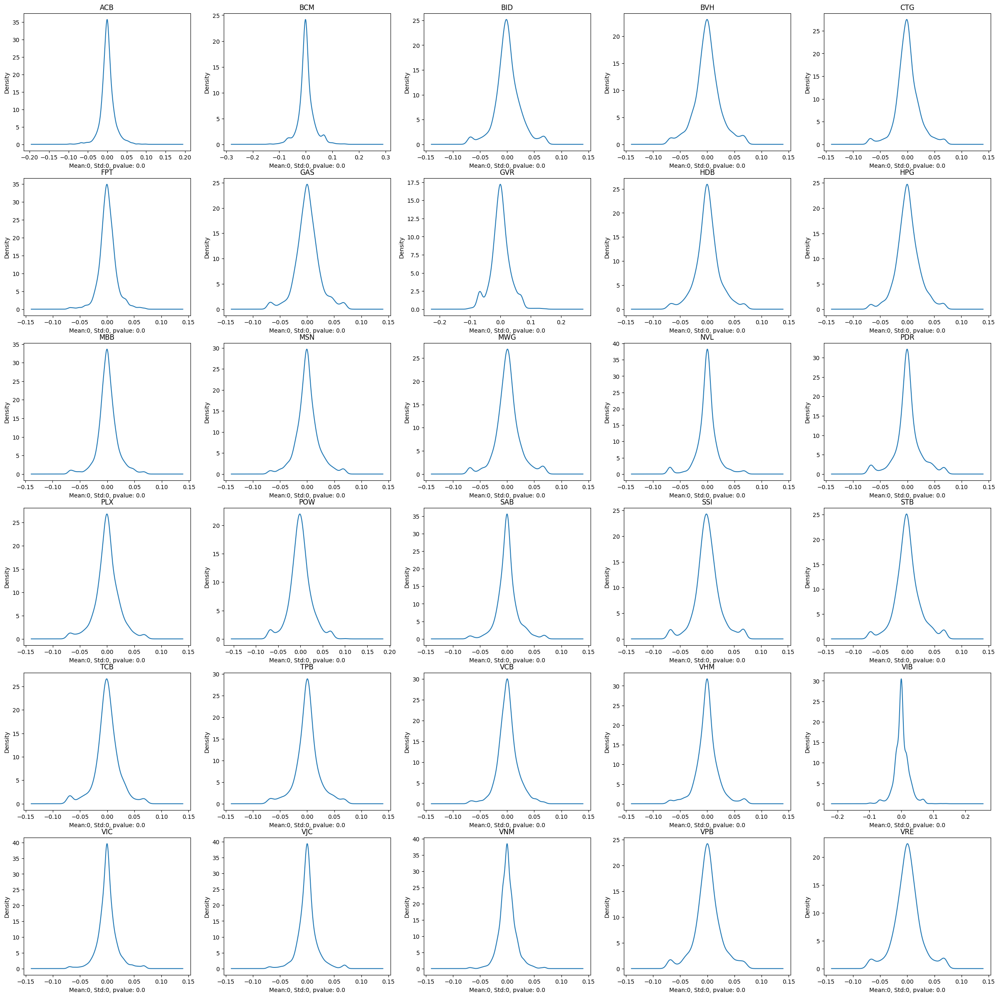

In [9]:
close, high, open, low, volume = stock_price(vn,"TOP30")
returns = close.pct_change()

df = returns
r =int(np.ceil(np.sqrt(df.shape[1])))
c = int(np.floor(np.sqrt(df.shape[1])))
fig, ax = plt.subplots(r, c,  figsize=(r*c, r*c))

# Plot the histograms
m=0
for row in range(r):
    for col in range(c):
        df.iloc[:,m].plot.kde(ax=ax[row, col])
        # ax[row, col].hist(df.iloc[m], bins=20)
        statistic, pvalue=stats.jarque_bera(returns.iloc[:,m].dropna()[1:])
        ax[row, col].set_title(df.iloc[:,m].name)
        ax[row,col].set_xlabel(f"Mean:{round(df.iloc[:,m].mean())}, Std:{round(df.iloc[:,m].std())}, pvalue: {round(pvalue,3)}")
        m+=1
        

# Display the plot
plt.show()

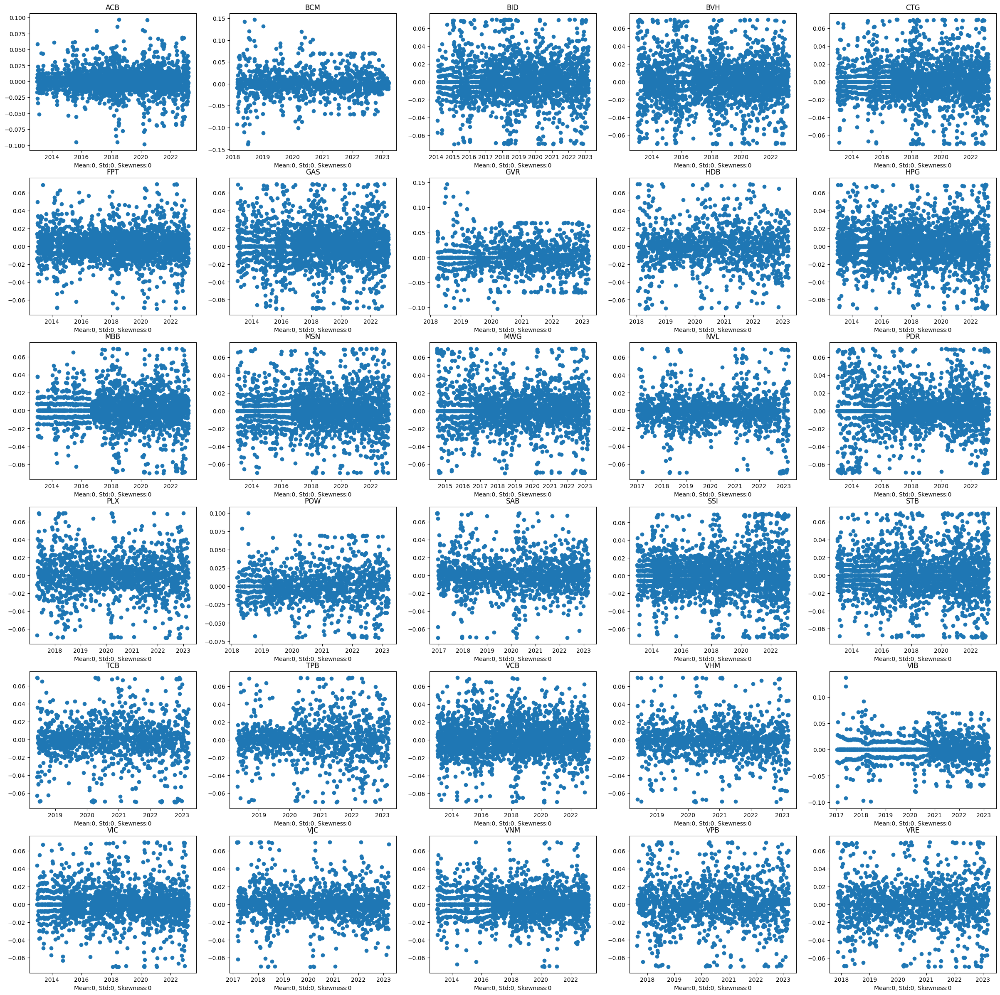

In [16]:
close, high, open, low, volume = stock_price(vn,"TOP30")
returns = close.pct_change()

df = returns
r =int(np.ceil(np.sqrt(df.shape[1])))
c = int(np.floor(np.sqrt(df.shape[1])))
fig, ax = plt.subplots(r, c,  figsize=(r*c, r*c))

m = 0
for row in range(r):
    for col in range(c):
        ax[row, col].scatter(x=df.index, y=df.iloc[:, m])
        ax[row, col].set_title(df.iloc[:, m].name)
        ax[row, col].set_xlabel(f"Mean:{round(df.iloc[:, m].mean())}, Std:{round(df.iloc[:, m].std())}, Skewness:{round(df.iloc[:, m].skew())}")
        m += 1

# Display the plot
plt.show()

In [6]:
df.iloc[:,2]

TradingDate
2013-01-02         NaN
2013-01-03         NaN
2013-01-04         NaN
2013-01-07         NaN
2013-01-08         NaN
                ...   
2023-03-13   -0.019088
2023-03-14   -0.025946
2023-03-15    0.038846
2023-03-16   -0.011752
2023-03-17    0.001081
Name: BID, Length: 2546, dtype: float64

# TOP100 VN

In [14]:
read_database_tabe(vn,"tickets")["TOP100"].dropna().to_list()

['AAA',
 'ACB',
 'AGG',
 'ANV',
 'ASM',
 'BCG',
 'BCM',
 'BID',
 'BMP',
 'BVH',
 'BWE',
 'CII',
 'CMG',
 'CRE',
 'CTD',
 'CTG',
 'CTR',
 'DBC',
 'DCM',
 'DGC',
 'DGW',
 'DHC',
 'DIG',
 'DPM',
 'DXG',
 'DXS',
 'EIB',
 'FPT',
 'FRT',
 'GAS',
 'GEG',
 'GEX',
 'GMD',
 'GVR',
 'HBC',
 'HCM',
 'HDB',
 'HDG',
 'HNG',
 'HPG',
 'HPX',
 'HSG',
 'HT1',
 'IMP',
 'KBC',
 'KDC',
 'KDH',
 'KOS',
 'LPB',
 'MBB',
 'MSB',
 'MSN',
 'MWG',
 'NKG',
 'NLG',
 'NT2',
 'NVL',
 'OCB',
 'PAN',
 'PC1',
 'PDR',
 'PHR',
 'PLX',
 'PNJ',
 'POW',
 'PPC',
 'PTB',
 'PVD',
 'PVT',
 'REE',
 'SAB',
 'SAM',
 'SBT',
 'SCR',
 'SCS',
 'SHB',
 'SJS',
 'SSB',
 'SSI',
 'STB',
 'SZC',
 'TCB',
 'TCH',
 'TMS',
 'TPB',
 'VCB',
 'VCG',
 'VCI',
 'VGC',
 'VHC',
 'VHM',
 'VIB',
 'VIC',
 'VJC',
 'VND',
 'VNM',
 'VPB',
 'VPI',
 'VRE',
 'VSH']

In [8]:
close, high, open, low, volume = stock_price(vn,"TOP100")
returns = close.pct_change()

df = returns
r =int(np.ceil(np.sqrt(df.shape[1])))
c = int(np.floor(np.sqrt(df.shape[1])))
fig, ax = plt.subplots(r, c,  figsize=(r*c, r*c))

# Plot the histograms
m=0
for row in range(r):
    for col in range(c):
        df.iloc[:,m].plot.kde(ax=ax[row, col])
        # ax[row, col].hist(df.iloc[m], bins=20)
        ax[row, col].set_title(df.iloc[:,m].name)
        ax[row,col].set_xlabel(f"Mean:{round(df.iloc[:,m].mean())}, Std:{round(df.iloc[:,m].std())}, Skewness: {round(df.iloc[:,m].skew())}")
        m+=1
        

# Display the plot
plt.show()

In [17]:
close, high, open, low, volume = stock_price(vn,"TOP100")
returns = close.pct_change()

df = returns
r =int(np.ceil(np.sqrt(df.shape[1])))
c = int(np.floor(np.sqrt(df.shape[1])))
fig, ax = plt.subplots(r, c,  figsize=(r*c, r*c))

m = 0
for row in range(r):
    for col in range(c):
        ax[row, col].scatter(x=df.index, y=df.iloc[:, m])
        ax[row, col].set_title(df.iloc[:, m].name)
        ax[row, col].set_xlabel(f"Mean:{round(df.iloc[:, m].mean())}, Std:{round(df.iloc[:, m].std())}, Skewness:{round(df.iloc[:, m].skew())}")
        m += 1

# Display the plot
plt.show()

In [18]:
close, high, open, low, volume = stock_price(vn,"TOP500")
returns = close.pct_change()

df = returns
r =int(np.ceil(np.sqrt(df.shape[1])))
c = int(np.floor(np.sqrt(df.shape[1])))
fig, ax = plt.subplots(r, c,  figsize=(r*c, r*c))

m = 0
for row in range(r):
    for col in range(c):
        ax[row, col].scatter(x=df.index, y=df.iloc[:, m])
        ax[row, col].set_title(df.iloc[:, m].name)
        ax[row, col].set_xlabel(f"Mean:{round(df.iloc[:, m].mean())}, Std:{round(df.iloc[:, m].std())}, Skewness:{round(df.iloc[:, m].skew())}")
        m += 1

# Display the plot
plt.show()

IndexError: single positional indexer is out-of-bounds